# Spotify Data Visualization

## Import Libraries and Data

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

In [2]:
#Load csv files
popularity = pd.read_csv('popularity_data.csv')
tracks = pd.read_csv('sp_track.csv')
features = pd.read_csv('audio_features.csv')

In [3]:
#Merge into one dataframe
df1 = popularity.merge(tracks[['track_id', 'isrc']], on = 'track_id', how = 'inner')
final_df = features.merge(df1, on = 'isrc', how = 'inner')

## Analysis
The features of the songs are analyzed against the popularity of the song;
* Graphs plotted in red have no influence on popularity.
* Graphs plotted in dark blue have a major influence on popularity.
* Graphs plotted in orange have a minor influence on popularity.

### Instrumentalness vs Popularity

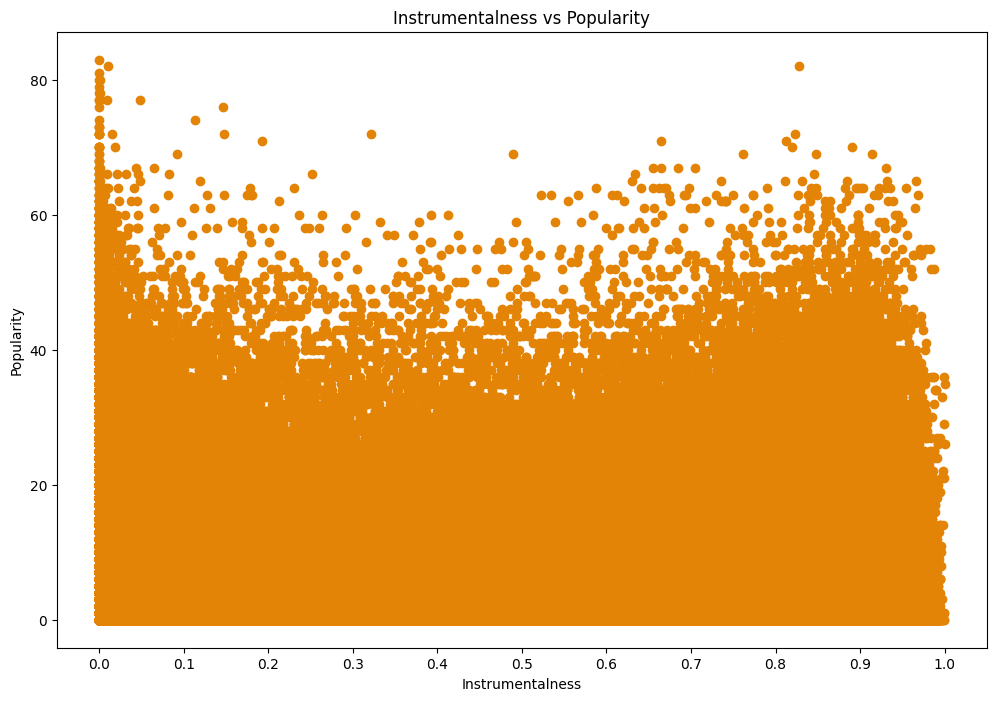

In [4]:
x = final_df['instrumentalness']
y = final_df['popularity']
x_range = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#e38407')
plt.xlabel('Instrumentalness')
plt.ylabel('Popularity')
plt.title('Instrumentalness vs Popularity')
plt.xticks(x_range)
plt.savefig('Instrumentalness vs Popularity')
plt.show()


Instrumentalness detects vocal presence in tracks, with lower values indicating more vocals. The scatter plot suggests minor influence of instrumentalness on track popularity.

### Speechiness vs Popularity

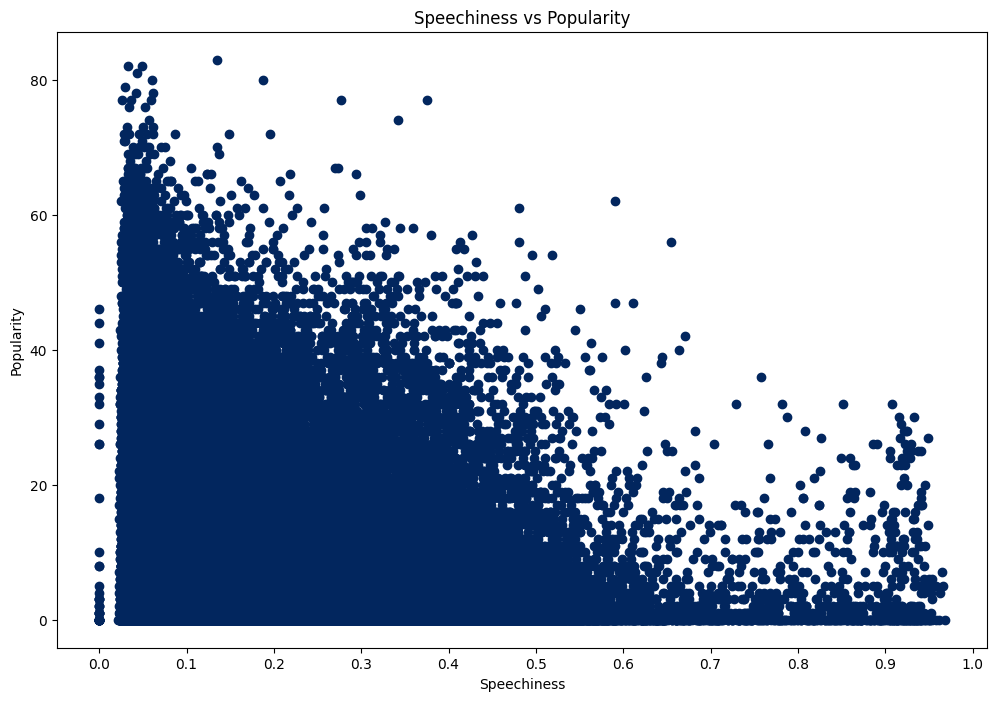

In [5]:
x = final_df['speechiness']
y = final_df['popularity']
x_range = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#02265e')
plt.xlabel('Speechiness')
plt.ylabel('Popularity')
plt.title('Speechiness vs Popularity')
plt.savefig('Speechiness vs Popularity')
plt.xticks(x_range)
plt.show()

Speechiness detects spoken words in tracks. A higher value indicates more spoken words, while a lower value indicates less spoken words. The scatter graph shows that higher speechiness corresponds to lower popularity and vice versa.

### Loudness vs Popularity

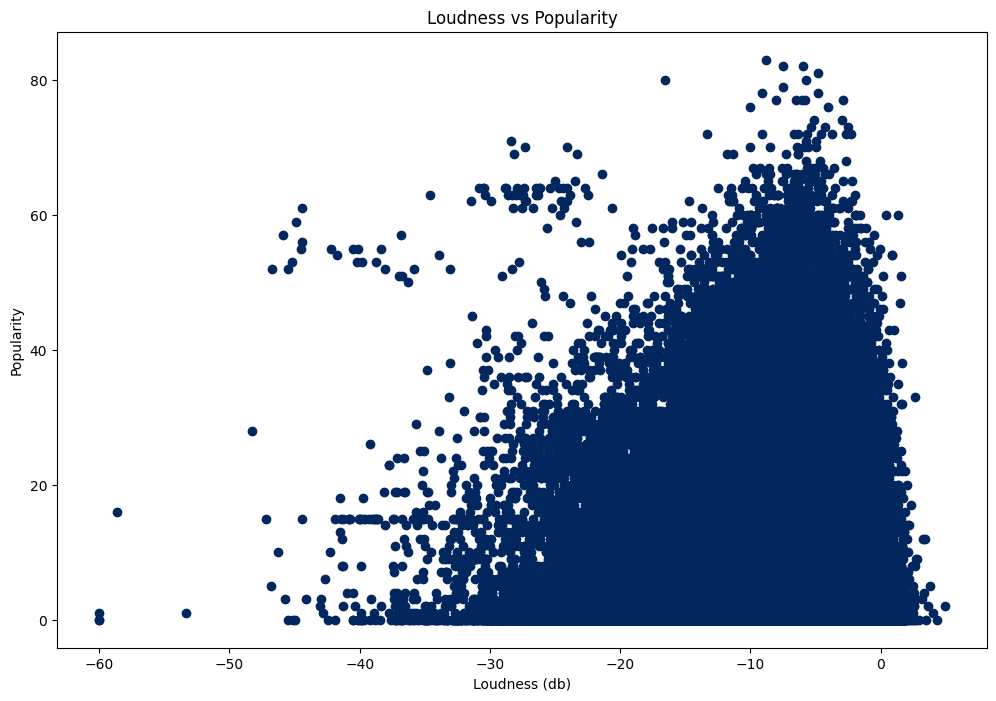

In [6]:
x = final_df['loudness']
y = final_df['popularity']

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#02265e')
plt.xlabel('Loudness (db)')
plt.ylabel('Popularity')
plt.title('Loudness vs Popularity')
plt.savefig('Loudness vs Popularity')
plt.show()

Loudness represents the track's overall loudness averaged across its duration. The graph indicates that higher loudness is associated with higher popularity.

### Valence vs Popularity

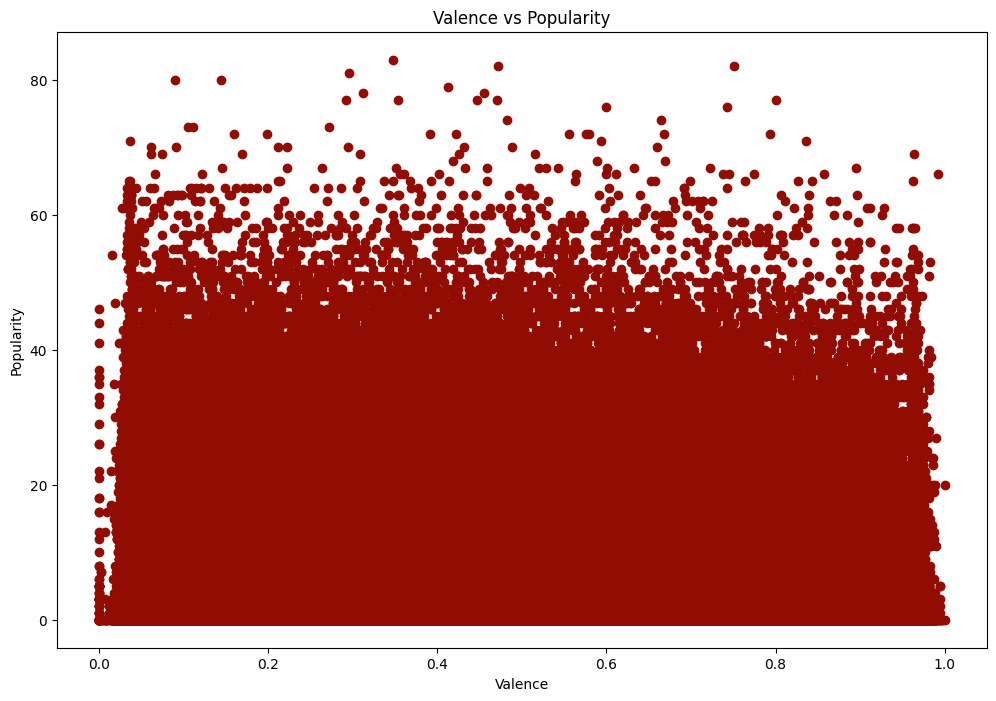

In [7]:
x = final_df['valence']
y = final_df['popularity']

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#910c03')
plt.xlabel('Valence')
plt.ylabel('Popularity')
plt.title('Valence vs Popularity')
plt.savefig('Valence vs Popularity')
plt.show()

Valence measures the positiveness of a track. The graph indicates that valence does not significantly impact the popularity of a track.

### Acousticness vs Popularity

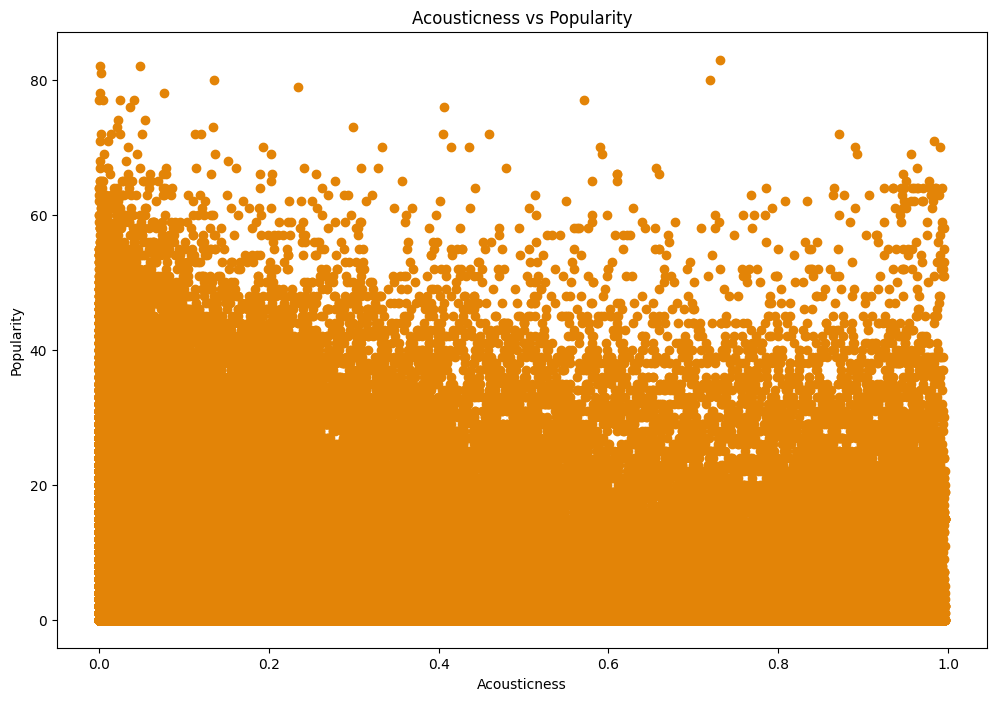

In [8]:
x = final_df['acousticness']
y = final_df['popularity']

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#e38407')
plt.xlabel('Acousticness')
plt.ylabel('Popularity')
plt.title('Acousticness vs Popularity')
plt.savefig('Acousticness vs Popularity')
plt.show()

The graph reveals a minor negative influence of acousticness on the popularity of a song.

### Energy vs Popularity

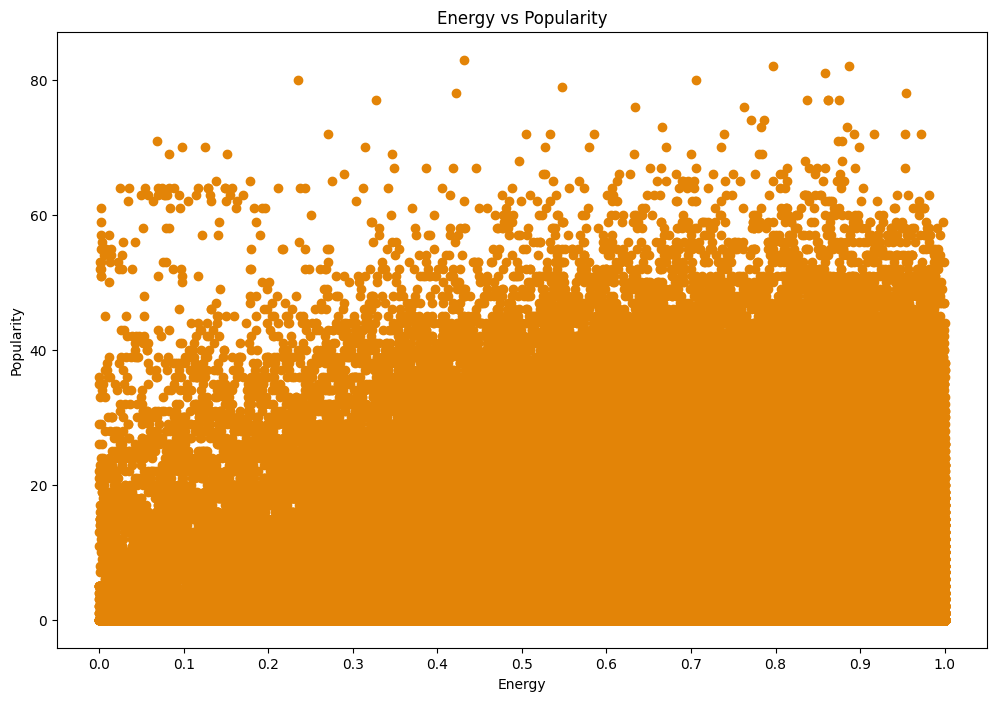

In [9]:
x = final_df['energy']
y = final_df['popularity']
x_range = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#e38407')
plt.xticks(x_range)
plt.xlabel('Energy')
plt.ylabel('Popularity')
plt.title('Energy vs Popularity')
plt.savefig('Energy vs Popularity')
plt.show()

Energy quantifies the perceptual intensity and activity of a track. Energetic tracks are often characterized by a sense of speed, loudness, and noise. The graph reveals a minor postive influence of energy on the popularity of a song.

### Tempo vs Popularity

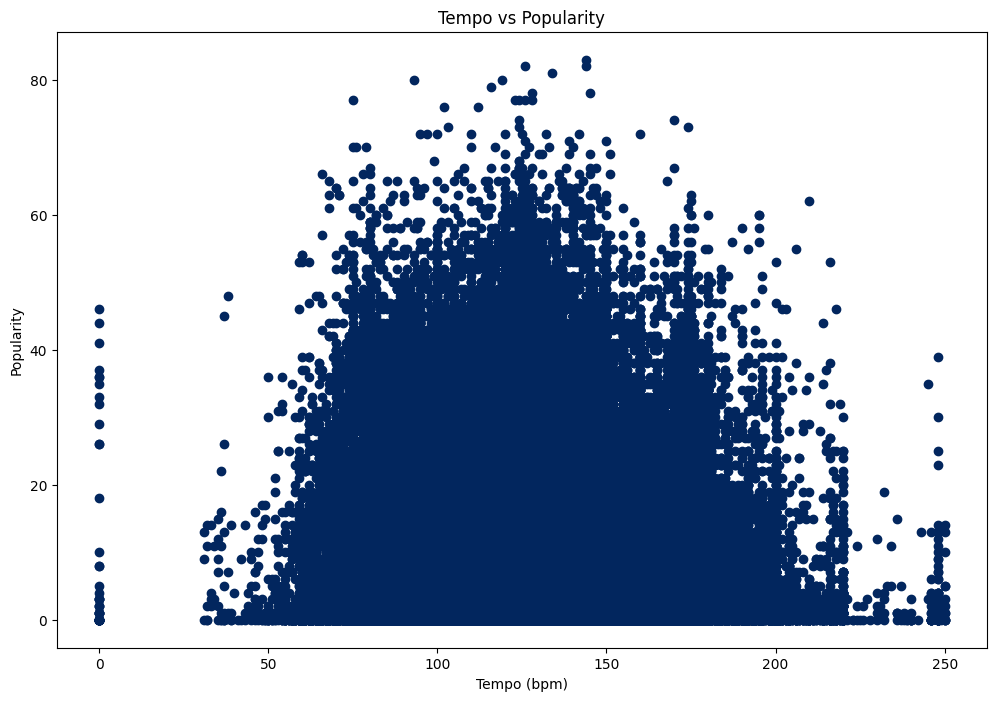

In [10]:
x = final_df['tempo']
y = final_df['popularity']

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#02265e')
plt.xlabel('Tempo (bpm)')
plt.ylabel('Popularity')
plt.title('Tempo vs Popularity')
plt.savefig('Tempo vs Popularity')
plt.show()

The tempo of a track, measured in beats per minute (BPM), reflects the overall speed or pace of the music, typically derived from the average beat duration. The graph illustrates a significant impact of tempo on popularity, with the majority of popular songs falling within the tempo range of 75 to 175 BPM.

### Liveness vs Popularity

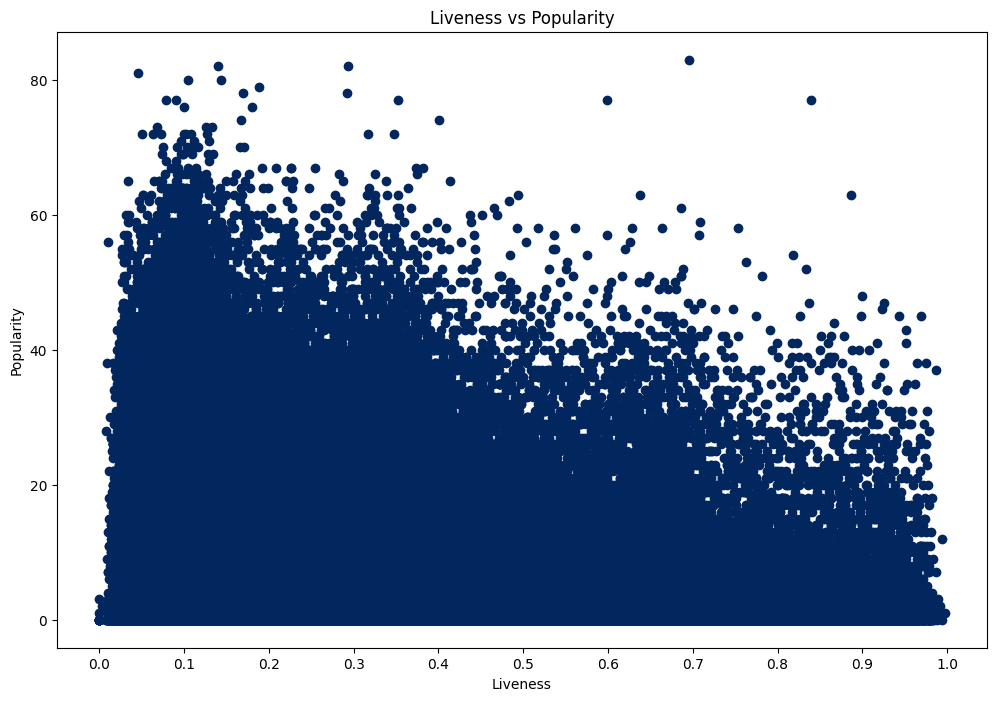

In [11]:
x = final_df['liveness']
y = final_df['popularity']
x_range = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#02265e')
plt.xticks(x_range)
plt.xlabel('Liveness')
plt.ylabel('Popularity')
plt.title('Liveness vs Popularity')
plt.savefig('Liveness vs Popularity')
plt.show()

Liveness is an indicator of the presence of a live audience during a recording. Higher liveness values suggest a greater likelihood of a live performance, with a value exceeding 0.8 indicating a strong probability of a live track. The graph demonstrates a noticeable negative influence of liveness on popularity.

### Key vs Popularity

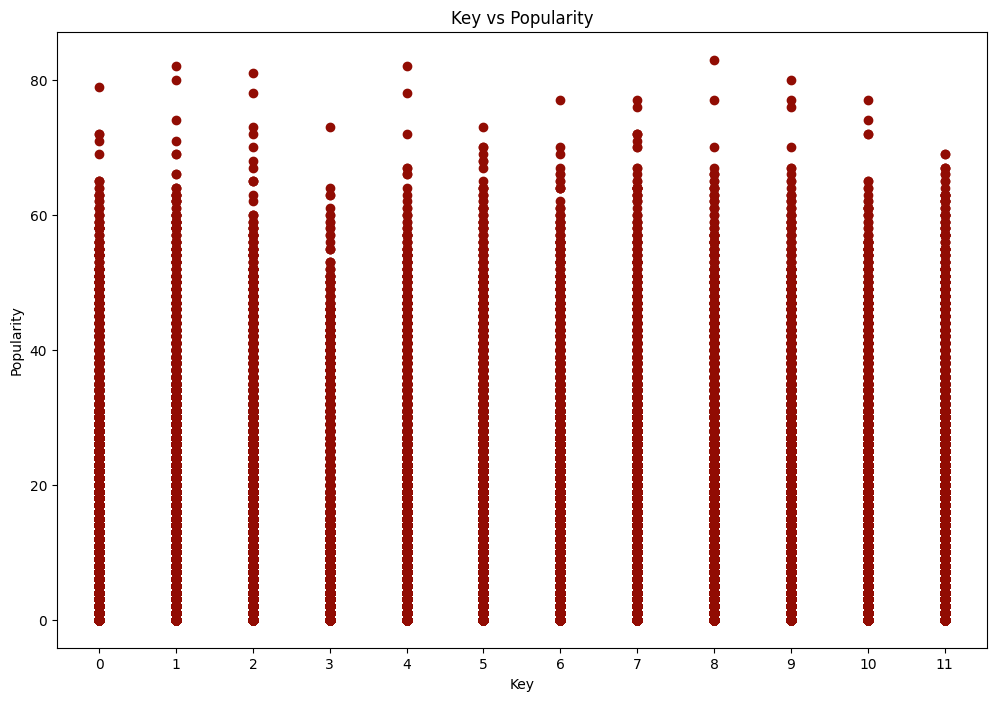

In [12]:
x = final_df['key']
y = final_df['popularity']
x_range = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

plt.figure(figsize = (12, 8)) 
plt.scatter(x, y, color = '#910c03')
plt.xticks(x_range)
plt.xlabel('Key')
plt.ylabel('Popularity')
plt.title('Key vs Popularity')
plt.savefig('Key vs Popularity')
plt.show()

The 'key' represents the pitch class in standard notation, with integers mapping to pitches (e.g., 0 = C, 1 = C♯/D♭, 2 = D, and so on). If no key is detected, the value is -1. Notably, the key does not exert any influence on the popularity of the track.

### Duration vs Popularity

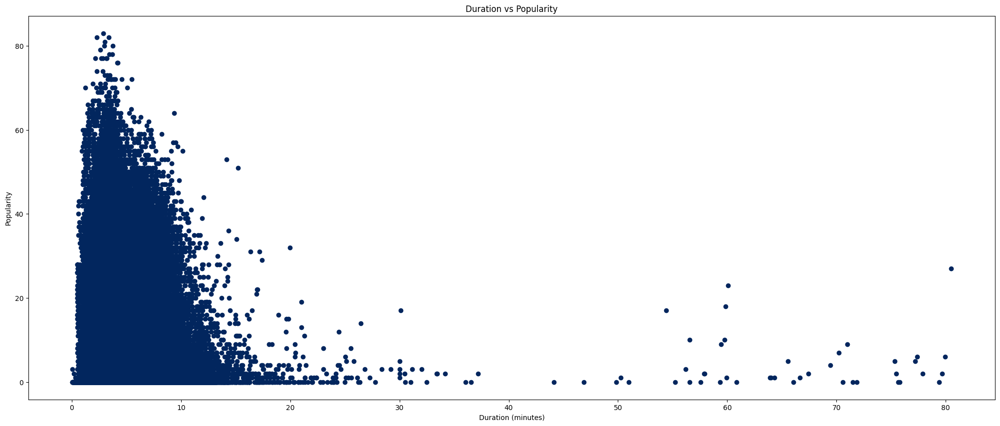

In [13]:
x = final_df['duration_ms'].map(lambda x : (x/1000)/60)
y = final_df['popularity']

plt.figure(figsize=(25, 10)) 
plt.scatter(x, y, color ='#02265e')
plt.xlabel('Duration (minutes)')
plt.ylabel('Popularity')
plt.title('Duration vs Popularity')
plt.savefig('Duration vs Popularity')
plt.show()

The duration of the track has an overall inverse relationship with its popularity; longer durations are less likely to result in a popular song.

### Danceability vs Popularity

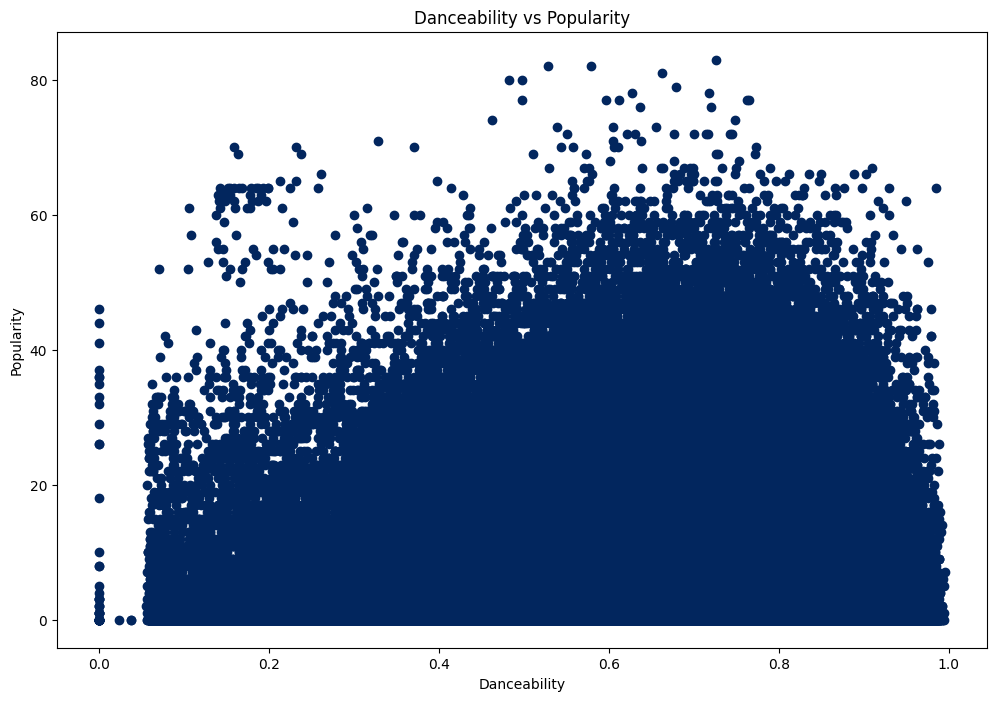

In [14]:
x = final_df['danceability']
y = final_df['popularity']

plt.figure(figsize=(12,8)) 
plt.scatter(x, y, color ='#02265e')
plt.xlabel('Danceability')
plt.ylabel('Popularity')
plt.title('Danceability vs Popularity')
plt.savefig('Danceability vs Popularity')
plt.show()

Danceability evaluates a track's dance-friendliness based on tempo, rhythm stability, beat strength, and regularity. Greater danceability positively correlates with a song's popularity and appears to be influenced by other features. Consequently, further analysis of the impact of danceability on a song might provide valuable insights.

#### Analyzing the Relationship Between Features, Danceability, and Popularity

The features of the songs are analyzed against the popularity of the song
* Graphs plotted in coolwarm colormap have no influence
* Graphs plotted in viridis colormap have influence

##### Loudness

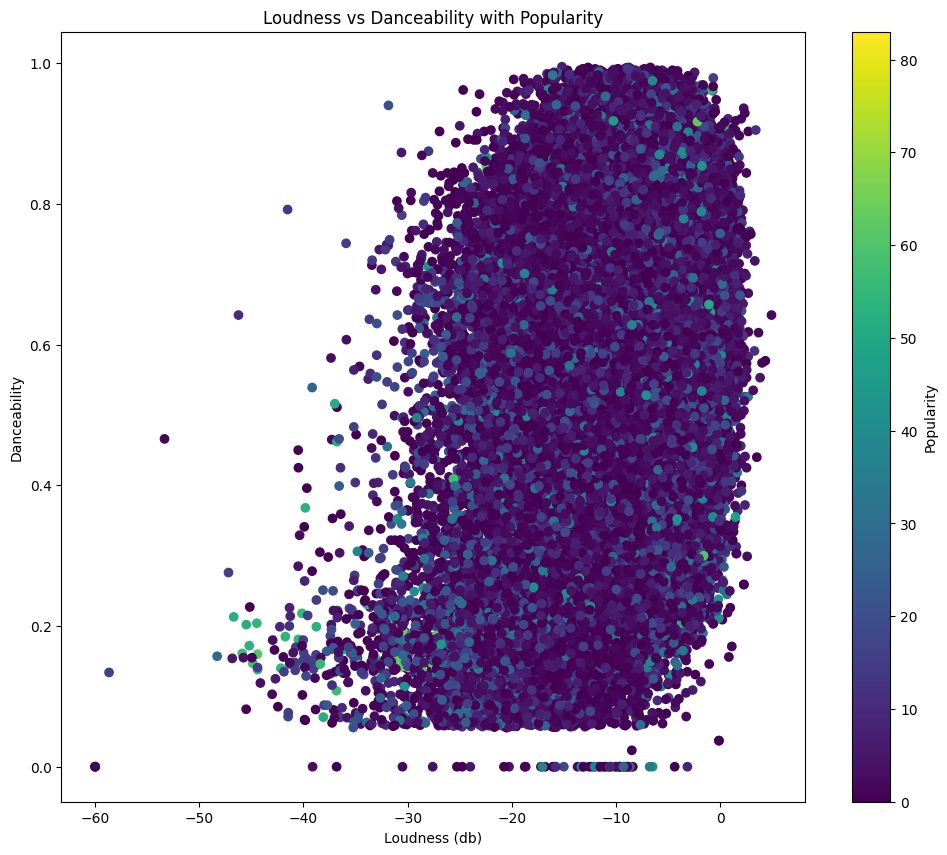

In [15]:
x = final_df['loudness']
y = final_df['danceability']

plt.figure(figsize = (12, 10))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Loudness (db)')
plt.ylabel('Danceability')
plt.title('Loudness vs Danceability with Popularity')
plt.savefig('Loudness vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Loudness has a minor impact on danceability, but together, they do not significantly influence popularity. 

##### Energy

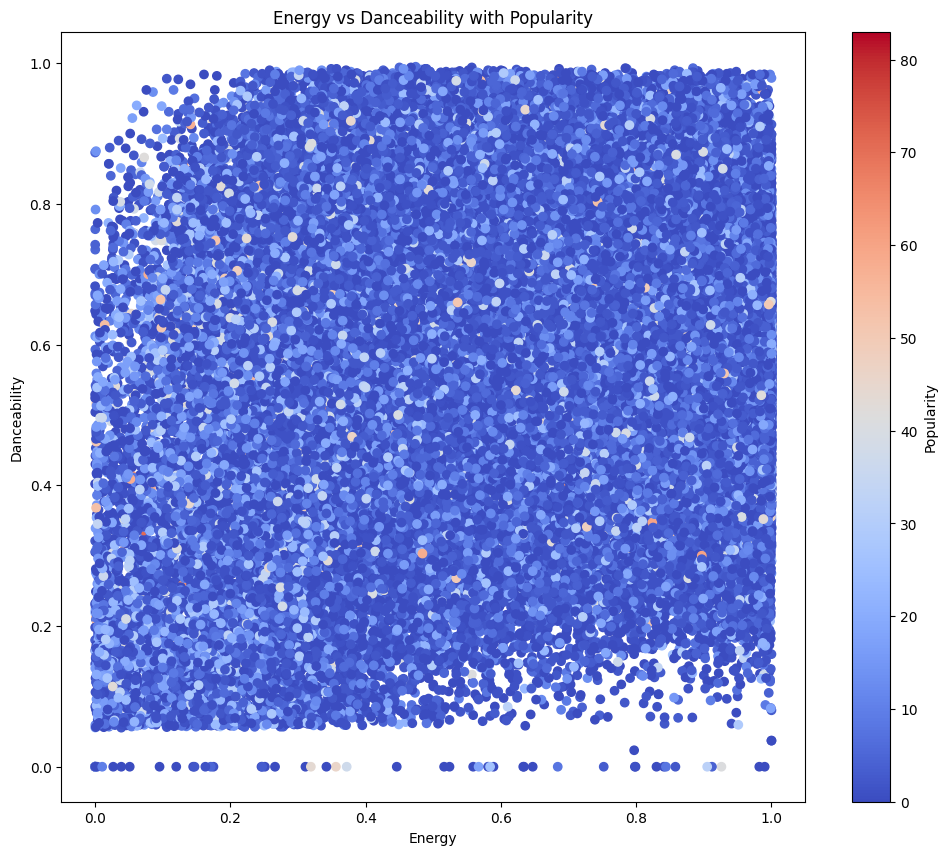

In [16]:
x = final_df['energy']
y = final_df['danceability']

plt.figure(figsize = (12, 10))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('coolwarm'))
plt.xlabel('Energy')
plt.ylabel('Danceability')
plt.title('Energy vs Danceability with Popularity')
plt.savefig('Energy vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Energy has no significant impact on the danceability of a song, making it a negligible feature.

##### Speechiness

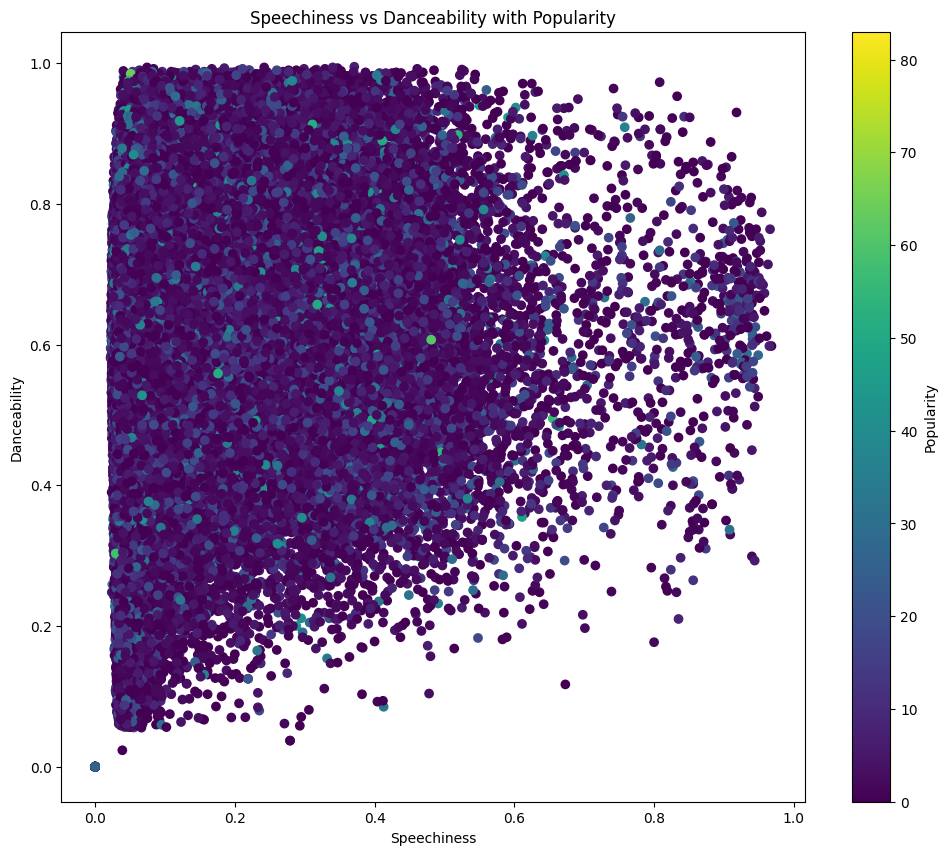

In [17]:
x = final_df['speechiness']
y = final_df['danceability']

plt.figure(figsize = (12, 10))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Speechiness')
plt.ylabel('Danceability')
plt.title('Speechiness vs Danceability with Popularity')
plt.savefig('Speechiness vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Speechiness has a significant influence on danceability, consequently impacting the song's popularity.

##### Valence

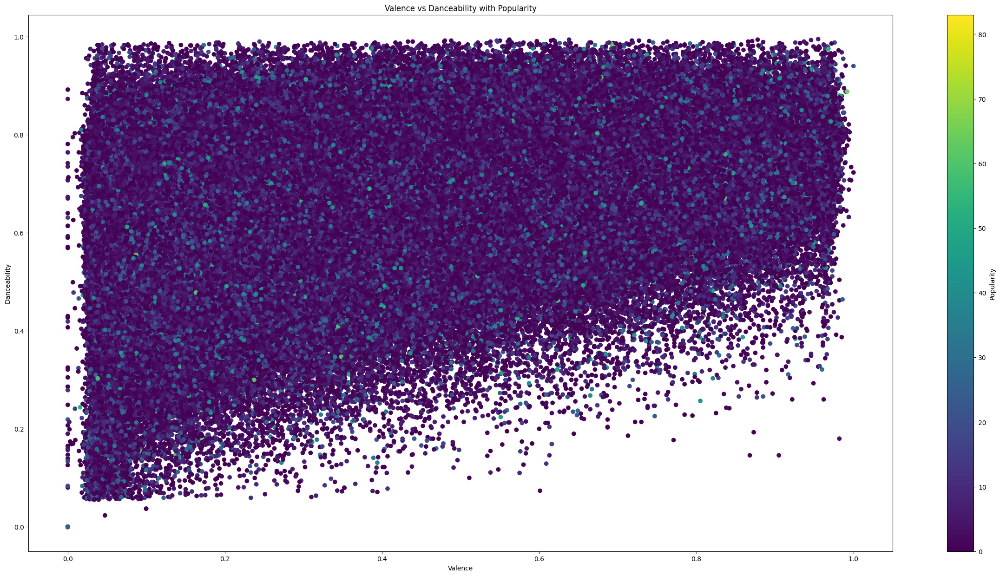

In [18]:
x = final_df['valence']
y = final_df['danceability']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Valence')
plt.ylabel('Danceability')
plt.title('Valence vs Danceability with Popularity')
plt.savefig('Valence vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Valence is another feature with substantial influence over danceability. The degree of emotional positivity in a track plays a significant role in shaping its danceability, which, in turn, affects the overall popularity of the song.

##### Instrumentalness

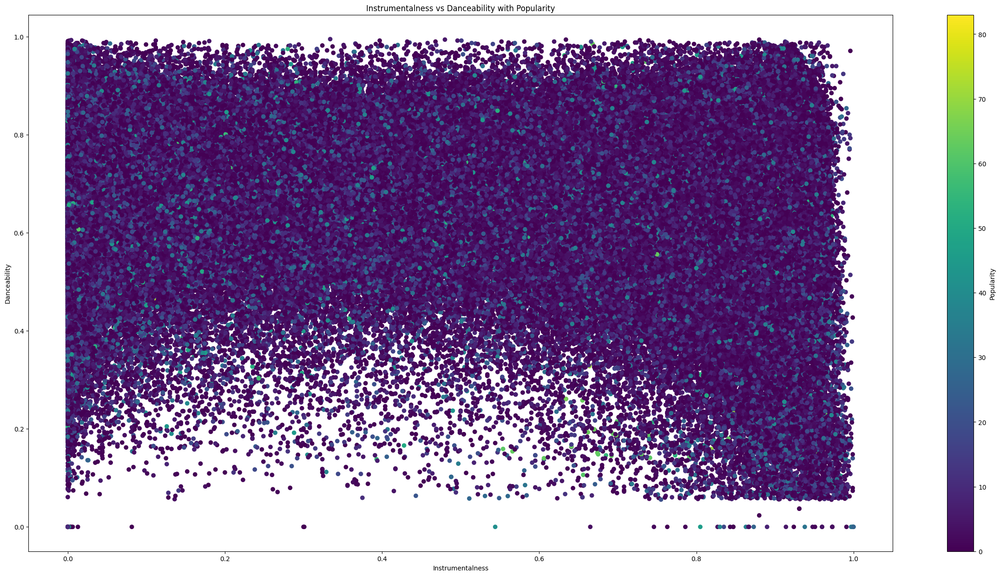

In [19]:
x = final_df['instrumentalness']
y = final_df['danceability']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Instrumentalness')
plt.ylabel('Danceability')
plt.title('Instrumentalness vs Danceability with Popularity')
plt.savefig('Instrumentalness vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Instrumentalness holds considerable sway over danceability, and this interplay between the two factors can significantly influence the overall popularity of a song, both positively and negatively.

##### Tempo

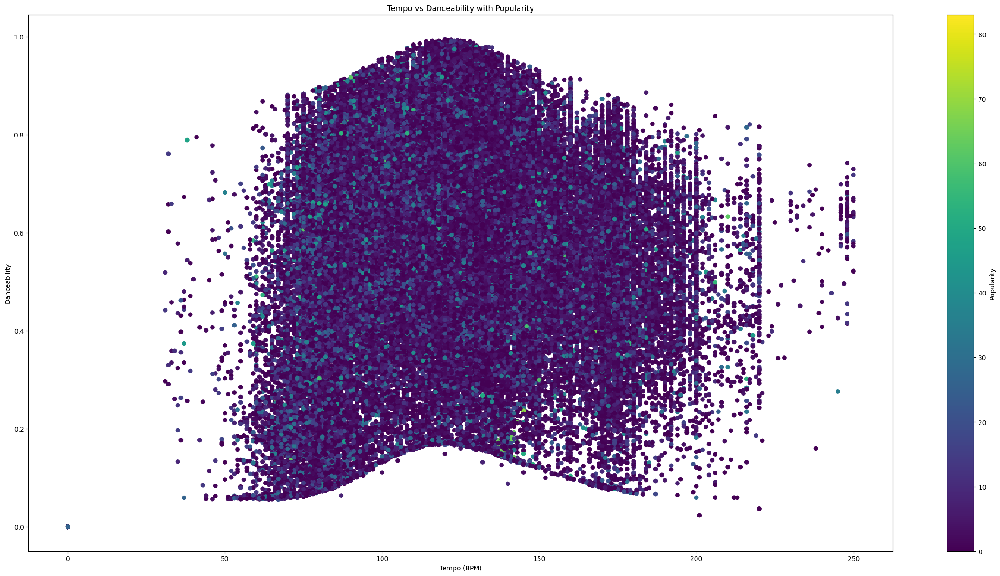

In [20]:
x = final_df['tempo']
y = final_df['danceability']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Tempo (BPM)')
plt.ylabel('Danceability')
plt.title('Tempo vs Danceability with Popularity')
plt.savefig('Tempo vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

This analysis show that tempo is yet another critical factor with a major impact on danceability.

##### Acousticness

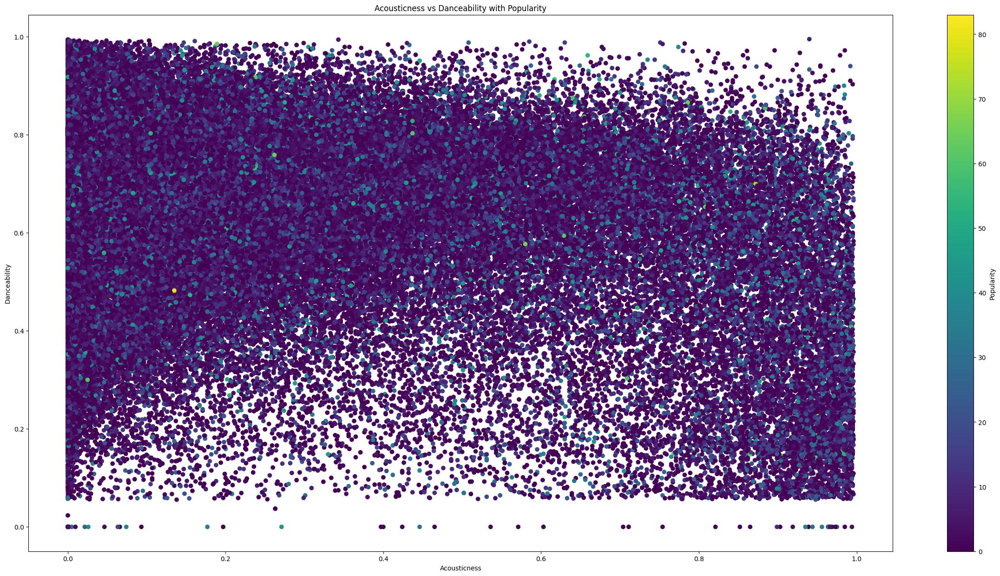

In [21]:
x = final_df['acousticness']
y = final_df['danceability']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Acousticness')
plt.ylabel('Danceability')
plt.title('Acousticness vs Danceability with Popularity')
plt.savefig('Acousticness vs Danceability with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Acousticness is another influential factor with a major impact on a song's danceability.

#### Analyzing the Relationship Between Features, Valence, and Popularity

Considering that valence can indirectly affect a song's popularity through its influence on danceability, a closer look at valence is warranted. This analysis aims to reveal the extent of valence's role in determining a song's overall popularity.

##### Instrumentalness

In [ ]:
x = final_df['instrumentalness']
y = final_df['valence']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('coolwarm'))
plt.xlabel('Instrumentalness')
plt.ylabel('Valence')
plt.title('Instrumentalness vs Valence with Popularity')
plt.savefig('Instrumentalness vs Valence with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Instrumentalness does not affect the valence.

##### Energy

In [ ]:
x = final_df['energy']
y = final_df['valence']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Energy')
plt.ylabel('Valence')
plt.title('Energy vs Valence with Popularity')
plt.savefig('Energy vs Valence with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Energy exhibits a positive impact on a song's valence, potentially influencing danceability, and, in turn, impacting its popularity. However, this influence is quite indirect and can be considered negligible in the overall context of popularity analysis.

##### Acousticness

In [ ]:
x = final_df['acousticness']
y = final_df['valence']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('coolwarm'))
plt.xlabel('Acousticness')
plt.ylabel('Valence')
plt.title('Acousticness vs Valence with Popularity')
plt.savefig('Acousticness vs Valence with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Acousticness exerts a minor and relatively insignificant impact on valence.

##### Loudness

In [ ]:
x = final_df['loudness']
y = final_df['valence']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Loudness')
plt.ylabel('Valence')
plt.title('Loudness vs Valence with Popularity')
plt.savefig('Loudness vs Valence with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Loudness significantly influences valence.

##### Liveness

In [ ]:
x = final_df['liveness']
y = final_df['valence']

plt.figure(figsize = (30, 15))
plt.scatter(x, y, c = final_df['popularity'], cmap = plt.get_cmap('viridis'))
plt.xlabel('Liveness')
plt.ylabel('Valence')
plt.title('Liveness vs Valence with Popularity')
plt.savefig('Liveness vs Valence with Popularity')
plt.colorbar(label = 'Popularity')
plt.show()

Liveness impacts valence.

This analysis suggests that valence plays a significant role in influencing other features and can indirectly affect a song's popularity.

## Insights

These are the key insights derived from the analysis:
* Features with a __direct influence__ on track popularity include __acousticness, loudness, speechiness, duration, tempo, liveness, danceability__, and __energy__.
* __Energy, instrumentalness__, and __acousticness__ exhibits a __minor influence__ on track popularity.
* __Loudness, speechiness, tempo, and liveness__ stand out as the features with the __most significant impacts__ on track popularity.
* __Valence__ may exert an __indirect influence__ on track popularity by influencing the __danceabilty__.
* __Energy, key__, and __mode__ are features that can be __disregarded__ when studying popularity.